In [2]:
import os
os.getcwd()
os.chdir("G:/OneDrive/casa0010dissertation/00_06 jaipur code_mgwr")

In [3]:
# K-Means Clustering Analysis on PC1 and PC2 Scores
# Purpose: Perform k-means clustering on PC1_Score_Original and PC2_Score
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Set random seed for reproducibility
np.random.seed(42)

In [5]:
# Set plotting style
# Basic plotting settings for matplotlib and seaborn
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl

import contextily as cx
from matplotlib.colors import Normalize

# Pandas display settings
pd.set_option('display.max_columns', None)

# Matplotlib basic settings
plt.style.use('default')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.rcParams['font.size'] = 16
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'

# Grid settings
plt.rcParams['axes.grid'] = True
plt.rcParams['axes.grid.axis'] = 'both'
plt.rcParams['grid.alpha'] = 0.3
plt.rcParams['grid.color'] = 'gray'
plt.rcParams['grid.linestyle'] = '-'
plt.rcParams['grid.linewidth'] = 0.5
plt.rcParams['axes.axisbelow'] = True

# Spine/border settings
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams['axes.spines.top'] = True
plt.rcParams['axes.spines.right'] = True
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['axes.edgecolor'] = 'gray'

# Matplotlib figure DPI setting
mpl.rcParams['figure.dpi'] = 300


sns.set_style("whitegrid", {
    "axes.spines.left": True,
    "axes.spines.bottom": True,
    "axes.spines.top": True,
    "axes.spines.right": True,
    "axes.linewidth": 0.5,
    "axes.edgecolor": "gray",
    "grid.color": "gray",
    "grid.alpha": 0.3,
    "axes.facecolor": "white"
})

sns.set_context(context="paper", font_scale=1.5, rc=None)
sns.set(font="serif")

# Additional libraries for geo-spatial analysis (if needed)
import geopandas as gpd
import contextily as cx
from matplotlib.colors import Normalize

# 1 load data

In [6]:
print("=== K-Means Clustering Analysis on Principal Component Scores ===")

# 1. Load the data
print("\n1. Loading the spatial data with PC scores...")

# Update this path to your actual file location
data_path = 'output/jaipur_economic_potential_index_re.parquet'  # or .shp
gdf = gpd.read_parquet(data_path)  # Use gpd.read_file() for .shp

print(f"Data loaded successfully. Shape: {gdf.shape}")
print(f"Available columns: {gdf.columns.tolist()}")

# Check for missing values in PC scores
pc_columns = ['PC1_Score_Original', 'PC2_Score']
print(f"\nMissing values check:")
for col in pc_columns:
    missing = gdf[col].isna().sum()
    print(f"  {col}: {missing} missing values")

# Remove rows with missing PC scores if any
gdf_clean = gdf.dropna(subset=pc_columns).copy()
print(f"Data after removing missing PC scores: {gdf_clean.shape}")

=== K-Means Clustering Analysis on Principal Component Scores ===

1. Loading the spatial data with PC scores...
Data loaded successfully. Shape: (1799, 23)
Available columns: ['hex_id', 'geometry', 'cover', 'transport_station_point', 'transport_station_polygon', 'motorable_road_nexwork', 'amenities_poi', 'office_poi', 'shop_poi', 'area_clip', 'pop_sum', 'builtup_sum', 'ndvi_mean', 'ntl_mean', 'pop_density_km2', 'builtup_density', 'PC1_Score_Original', 'PC1_Score_Corrected', 'PC2_Score', 'EPI_o', 'EPI', 'EPI_o_Category', 'EPI_Category']

Missing values check:
  PC1_Score_Original: 0 missing values
  PC2_Score: 0 missing values
Data after removing missing PC scores: (1799, 23)


# 2 Exploratory Data Analysis of PC Scores


2. Exploratory Data Analysis of PC Scores...
PC Scores Statistics:
       PC1_Score_Original     PC2_Score
count        1.799000e+03  1.799000e+03
mean         6.319446e-17  4.739585e-17
std          2.065927e+00  1.266198e+00
min         -5.473376e+00 -1.832905e+00
25%         -1.070884e+00 -8.404728e-01
50%          3.253059e-01 -3.875306e-01
75%          1.460099e+00  6.029283e-01
max          5.608138e+00  7.522032e+00


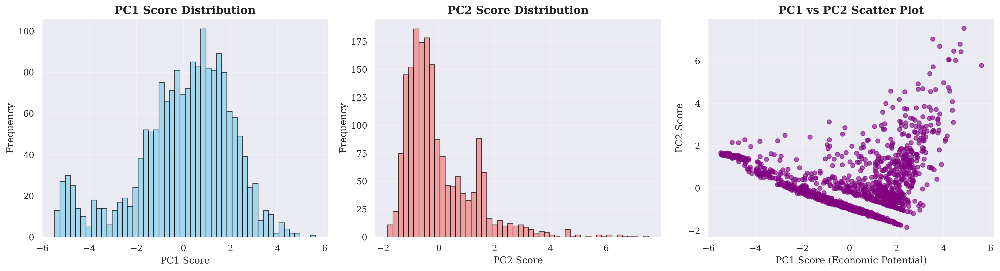

In [7]:
# 2. Exploratory Data Analysis of PC Scores
print("\n2. Exploratory Data Analysis of PC Scores...")

# Basic statistics
print("PC Scores Statistics:")
print(gdf_clean[pc_columns].describe())

# Create visualization of PC scores distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# PC1 distribution
axes[0].hist(gdf_clean['PC1_Score_Original'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
axes[0].set_title('PC1 Score Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('PC1 Score')
axes[0].set_ylabel('Frequency')
axes[0].grid(True, alpha=0.3)

# PC2 distribution
axes[1].hist(gdf_clean['PC2_Score'], bins=50, alpha=0.7, color='lightcoral', edgecolor='black')
axes[1].set_title('PC2 Score Distribution', fontsize=14, fontweight='bold')
axes[1].set_xlabel('PC2 Score')
axes[1].set_ylabel('Frequency')
axes[1].grid(True, alpha=0.3)

# PC1 vs PC2 scatter plot
scatter = axes[2].scatter(gdf_clean['PC1_Score_Original'], gdf_clean['PC2_Score'],
                         alpha=0.6, s=30, c='purple')
axes[2].set_title('PC1 vs PC2 Scatter Plot', fontsize=14, fontweight='bold')
axes[2].set_xlabel('PC1 Score (Economic Potential)')
axes[2].set_ylabel('PC2 Score')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('image/pc_scores_exploratory.png', dpi=300, bbox_inches='tight')
plt.show()

# 3 Preprocessing for K-Means Clustering

In [8]:
# 3. Prepare data for K-Means clustering
print("\n3. Preparing data for K-Means clustering...")

# Extract PC scores for clustering
X = gdf_clean[pc_columns].values
print(f"Clustering data shape: {X.shape}")

# Check if standardization is needed (PC scores should already be centered)
print("\nPC Scores statistics before clustering:")
print(f"PC1 - Mean: {X[:, 0].mean():.4f}, Std: {X[:, 0].std():.4f}")
print(f"PC2 - Mean: {X[:, 1].mean():.4f}, Std: {X[:, 1].std():.4f}")

# Standardize the data (recommended for k-means)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print("\nStandardized PC Scores statistics:")
print(f"PC1 - Mean: {X_scaled[:, 0].mean():.4f}, Std: {X_scaled[:, 0].std():.4f}")
print(f"PC2 - Mean: {X_scaled[:, 1].mean():.4f}, Std: {X_scaled[:, 1].std():.4f}")


3. Preparing data for K-Means clustering...
Clustering data shape: (1799, 2)

PC Scores statistics before clustering:
PC1 - Mean: 0.0000, Std: 2.0654
PC2 - Mean: 0.0000, Std: 1.2658

Standardized PC Scores statistics:
PC1 - Mean: 0.0000, Std: 1.0000
PC2 - Mean: 0.0000, Std: 1.0000


# 4 Determine optimal number of clusters

In [9]:
# 4. Determine optimal number of clusters using Silhouette Score
print("\n4. Determining optimal number of clusters using Silhouette Score...")

# Test different numbers of clusters (2 to 10)
k_range = range(2, 11)
silhouette_scores = []

print("Evaluating different numbers of clusters...")
for k in k_range:
    # Fit K-Means
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_scaled)

    # Calculate Silhouette Score
    sil_score = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(sil_score)

    print(f"k={k}: Silhouette Score = {sil_score:.4f}")


4. Determining optimal number of clusters using Silhouette Score...
Evaluating different numbers of clusters...
k=2: Silhouette Score = 0.5006
k=3: Silhouette Score = 0.5536
k=4: Silhouette Score = 0.4656
k=5: Silhouette Score = 0.4818
k=6: Silhouette Score = 0.4685
k=7: Silhouette Score = 0.4724
k=8: Silhouette Score = 0.4629
k=9: Silhouette Score = 0.4709
k=10: Silhouette Score = 0.4616


In [10]:
# 5. Find the elbow point in Silhouette Score curve
print("\n5. Finding the elbow point in Silhouette Score curve...")

def find_elbow_point(k_values, scores):
    """
    Find the elbow point using the maximum distance from line method
    """
    # Convert to numpy arrays
    k_values = np.array(k_values)
    scores = np.array(scores)

    # Calculate the line from first to last point
    line_start = np.array([k_values[0], scores[0]])
    line_end = np.array([k_values[-1], scores[-1]])

    # Calculate distances from each point to the line
    distances = []
    for i in range(len(k_values)):
        point = np.array([k_values[i], scores[i]])
        # Distance from point to line
        line_vec = line_end - line_start
        point_vec = point - line_start
        line_len = np.linalg.norm(line_vec)
        line_unit = line_vec / line_len
        proj_length = np.dot(point_vec, line_unit)
        proj_point = line_start + proj_length * line_unit
        distance = np.linalg.norm(point - proj_point)
        distances.append(distance)

    # Find the point with maximum distance (elbow)
    elbow_idx = np.argmax(distances)
    return k_values[elbow_idx], elbow_idx, distances

# Find elbow point
optimal_k_elbow, elbow_idx, distances = find_elbow_point(list(k_range), silhouette_scores)

# Alternative method: Find the point where the rate of improvement slows down significantly
def find_silhouette_elbow_alternative(k_values, scores):
    """
    Find elbow using rate of change method
    """
    # Calculate first and second derivatives
    first_diff = np.diff(scores)
    second_diff = np.diff(first_diff)

    # Find where the second derivative is closest to zero (inflection point)
    # or where the first derivative drops significantly
    if len(second_diff) > 0:
        # Find the k where improvement rate significantly decreases
        improvement_threshold = np.mean(first_diff) * 0.3  # 30% of average improvement
        for i, diff in enumerate(first_diff):
            if diff < improvement_threshold:
                return k_values[i + 1]  # +1 because diff is one element shorter

    # Fallback: return k with highest silhouette score
    return k_values[np.argmax(scores)]

optimal_k_alternative = find_silhouette_elbow_alternative(list(k_range), silhouette_scores)

print(f"Elbow point analysis:")
print(f"  Method 1 (Maximum distance from line): k = {optimal_k_elbow}")
print(f"  Method 2 (Rate of change): k = {optimal_k_alternative}")
print(f"  Maximum Silhouette Score: k = {k_range[np.argmax(silhouette_scores)]}")


5. Finding the elbow point in Silhouette Score curve...
Elbow point analysis:
  Method 1 (Maximum distance from line): k = 3
  Method 2 (Rate of change): k = 4
  Maximum Silhouette Score: k = 3



6. Visualizing Silhouette Score curve with elbow point...


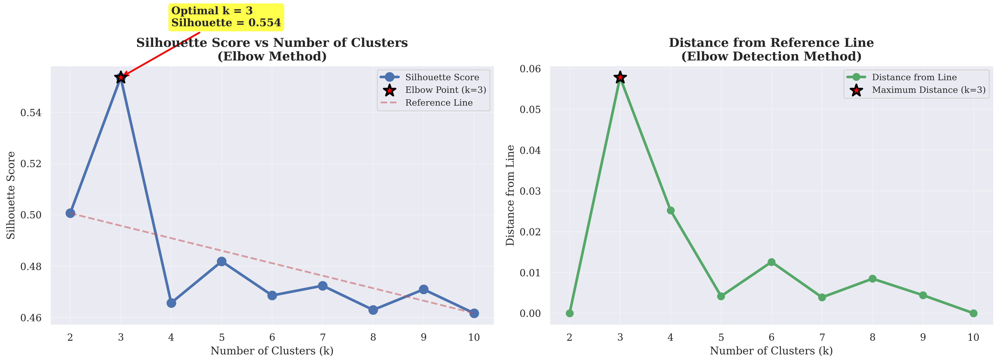


Detailed Silhouette Score Analysis:
    k  Silhouette_Score  Distance_from_Line  Score_Improvement
0   2            0.5006              0.0000             0.0000
1   3            0.5536              0.0578             0.0530
2   4            0.4656              0.0252            -0.0880
3   5            0.4818              0.0042             0.0162
4   6            0.4685              0.0126            -0.0133
5   7            0.4724              0.0039             0.0038
6   8            0.4629              0.0085            -0.0095
7   9            0.4709              0.0044             0.0080
8  10            0.4616              0.0000            -0.0093

RECOMMENDED OPTIMAL K: 3
Silhouette Score: 0.5536
Reasoning: Elbow point detected using maximum distance from reference line


In [11]:
# 6. Visualize Silhouette Score with elbow point detection
print("\n6. Visualizing Silhouette Score curve with elbow point...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Silhouette Score curve with elbow point
axes[0].plot(k_range, silhouette_scores, 'bo-', linewidth=3, markersize=10, label='Silhouette Score')

# Highlight the elbow point
axes[0].scatter(optimal_k_elbow, silhouette_scores[elbow_idx],
               color='red', s=200, marker='*', edgecolors='black', linewidth=2,
               label=f'Elbow Point (k={optimal_k_elbow})', zorder=5)

# Add line from first to last point to visualize elbow detection
line_x = [k_range[0], k_range[-1]]
line_y = [silhouette_scores[0], silhouette_scores[-1]]
axes[0].plot(line_x, line_y, 'r--', alpha=0.5, linewidth=2, label='Reference Line')

# Annotate the elbow point
axes[0].annotate(f'Optimal k = {optimal_k_elbow}\nSilhouette = {silhouette_scores[elbow_idx]:.3f}',
                xy=(optimal_k_elbow, silhouette_scores[elbow_idx]),
                xytext=(optimal_k_elbow + 1, silhouette_scores[elbow_idx] + 0.02),
                arrowprops=dict(arrowstyle='->', color='red', lw=2),
                fontsize=12, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))

axes[0].set_title('Silhouette Score vs Number of Clusters\n(Elbow Method)',
                 fontsize=14, fontweight='bold')
axes[0].set_xlabel('Number of Clusters (k)', fontsize=12)
axes[0].set_ylabel('Silhouette Score', fontsize=12)
axes[0].grid(True, alpha=0.3)
axes[0].legend(fontsize=10)
axes[0].set_xticks(k_range)

# Plot 2: Distance from line (for elbow detection visualization)
axes[1].plot(k_range, distances, 'go-', linewidth=3, markersize=8, label='Distance from Line')
axes[1].scatter(optimal_k_elbow, distances[elbow_idx],
               color='red', s=200, marker='*', edgecolors='black', linewidth=2,
               label=f'Maximum Distance (k={optimal_k_elbow})', zorder=5)

axes[1].set_title('Distance from Reference Line\n(Elbow Detection Method)',
                 fontsize=14, fontweight='bold')
axes[1].set_xlabel('Number of Clusters (k)', fontsize=12)
axes[1].set_ylabel('Distance from Line', fontsize=12)
axes[1].grid(True, alpha=0.3)
axes[1].legend(fontsize=10)
axes[1].set_xticks(k_range)

plt.tight_layout()
plt.savefig('image/silhouette_elbow_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# Create a detailed analysis table
analysis_df = pd.DataFrame({
    'k': list(k_range),
    'Silhouette_Score': silhouette_scores,
    'Distance_from_Line': distances,
    'Score_Improvement': [0] + list(np.diff(silhouette_scores))
})

print("\nDetailed Silhouette Score Analysis:")
print(analysis_df.round(4))

# Recommend optimal k
final_optimal_k = optimal_k_elbow
print(f"\n" + "="*50)
print(f"RECOMMENDED OPTIMAL K: {final_optimal_k}")
print(f"Silhouette Score: {silhouette_scores[elbow_idx]:.4f}")
print(f"Reasoning: Elbow point detected using maximum distance from reference line")
print(f"="*50)

# 5 Perform K-Means Clustering


7. Performing final K-Means clustering...
Using k = 3 clusters (determined by Silhouette Score elbow analysis)
Clustering completed with k=3. Final metrics:
  Silhouette Score: 0.5536
  Calinski-Harabasz Score: 1986.6
  Davies-Bouldin Score: 0.643

Cluster distribution:
  Cluster_1: 267 hexagons (14.8%)
  Cluster_2: 1245 hexagons (69.2%)
  Cluster_3: 287 hexagons (16.0%)
Cluster colors defined:
  Cluster 1: #1f77b4
  Cluster 2: #8e44ad
  Cluster 3: #f1c40f

8. Visualizing clustering results...


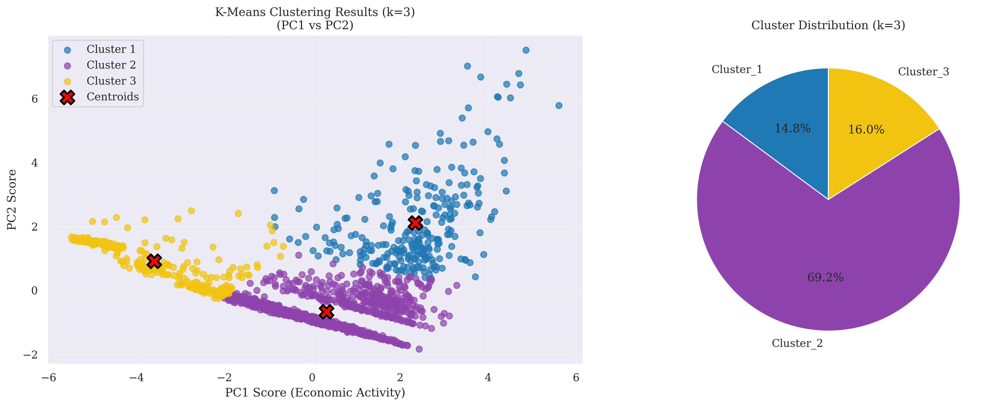

In [12]:
# 7. Perform final K-Means clustering with optimal k from elbow analysis
print("\n7. Performing final K-Means clustering...")

# Use the k determined by elbow point analysis
optimal_k = final_optimal_k
print(f"Using k = {optimal_k} clusters (determined by Silhouette Score elbow analysis)")

# Fit final K-Means model
final_kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = final_kmeans.fit_predict(X_scaled)

# Add cluster labels to the dataframe
gdf_clean['Cluster'] = cluster_labels
gdf_clean['Cluster_Label'] = gdf_clean['Cluster'].apply(lambda x: f'Cluster_{x + 1}')

# Calculate final metrics for the chosen k
final_silhouette = silhouette_score(X_scaled, cluster_labels)
final_calinski = calinski_harabasz_score(X_scaled, cluster_labels)
final_davies = davies_bouldin_score(X_scaled, cluster_labels)

print(f"Clustering completed with k={optimal_k}. Final metrics:")
print(f"  Silhouette Score: {final_silhouette:.4f}")
print(f"  Calinski-Harabasz Score: {final_calinski:.1f}")
print(f"  Davies-Bouldin Score: {final_davies:.3f}")

# Cluster distribution
print(f"\nCluster distribution:")
cluster_counts = gdf_clean['Cluster_Label'].value_counts().sort_index()
for cluster, count in cluster_counts.items():
    percentage = (count / len(gdf_clean)) * 100
    print(f"  {cluster}: {count} hexagons ({percentage:.1f}%)")

# 7.1 color palette for clusters

# Define a color palette for clusters
cluster_colors = ['#1f77b4', '#8e44ad', '#f1c40f']  
if optimal_k > 3:
    extra_colors = ['#e74c3c', '#2ecc71', '#95a5a6']  
    cluster_colors.extend(extra_colors[:optimal_k-3])

cluster_color_dict = {i: cluster_colors[i] for i in range(optimal_k)}


gdf_clean['Cluster_Color'] = gdf_clean['Cluster'].map(cluster_color_dict)

print("Cluster colors defined:")
for i, color in enumerate(cluster_colors[:optimal_k]):
    print(f"  Cluster {i+1}: {color}")



# 8. Visualize clustering results
print("\n8. Visualizing clustering results...")

# Create cluster visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scatter plot with clusters 
for i, cluster in enumerate(sorted(gdf_clean['Cluster'].unique())):
    cluster_data = gdf_clean[gdf_clean['Cluster'] == cluster]
    axes[0].scatter(cluster_data['PC1_Score_Original'], cluster_data['PC2_Score'],
                   c=cluster_colors[cluster], label=f'Cluster {cluster + 1}', alpha=0.7, s=40)

# Plot cluster centers on original scale
cluster_centers_original = scaler.inverse_transform(final_kmeans.cluster_centers_)
axes[0].scatter(cluster_centers_original[:, 0], cluster_centers_original[:, 1],
               c='red', marker='X', s=200, edgecolors='black', linewidth=2,
               label='Centroids')

axes[0].set_title(f'K-Means Clustering Results (k={optimal_k})\n(PC1 vs PC2)')
axes[0].set_xlabel('PC1 Score (Economic Activity)')
axes[0].set_ylabel('PC2 Score')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Cluster size pie chart (使用定义的颜色)
cluster_sizes = gdf_clean['Cluster_Label'].value_counts().sort_index()
pie_colors = [cluster_colors[i] for i in range(optimal_k)]
axes[1].pie(cluster_sizes.values, labels=cluster_sizes.index, autopct='%1.1f%%',
           colors=pie_colors, startangle=90)
axes[1].set_title(f'Cluster Distribution (k={optimal_k})')

plt.tight_layout()
plt.savefig('image/kmeans_clustering_results.png', dpi=300, bbox_inches='tight')
plt.show()

In [13]:
# 8. Analyze cluster characteristics
print("\n8. Analyzing cluster characteristics...")

# Calculate cluster statistics for PC scores
cluster_stats = gdf_clean.groupby('Cluster_Label')[pc_columns].agg(['mean', 'std', 'min', 'max'])
print("Cluster Statistics for PC Scores:")
print(cluster_stats.round(3))

# Analyze cluster characteristics using original variables
original_vars = ['transport_station_point', 'transport_station_polygon',
                'motorable_road_nexwork', 'amenities_poi', 'office_poi', 'shop_poi',
                'pop_density_km2', 'builtup_density', 'ndvi_mean', 'ntl_mean']

print(f"\nCluster Characteristics (Original Variables):")
cluster_characteristics = gdf_clean.groupby('Cluster_Label')[original_vars].mean()
print(cluster_characteristics.round(3))


8. Analyzing cluster characteristics...
Cluster Statistics for PC Scores:
              PC1_Score_Original                      PC2_Score                \
                            mean    std    min    max      mean    std    min   
Cluster_Label                                                                   
Cluster_1                  2.343  1.098 -0.866  5.608     2.113  1.384  0.380   
Cluster_2                  0.326  1.135 -1.989  3.285    -0.663  0.468 -1.833   
Cluster_3                 -3.593  1.252 -5.473 -0.658     0.911  0.654 -0.242   

                      
                 max  
Cluster_Label         
Cluster_1      7.522  
Cluster_2      1.105  
Cluster_3      2.496  

Cluster Characteristics (Original Variables):
               transport_station_point  transport_station_polygon  \
Cluster_Label                                                       
Cluster_1                        6.488                      0.010   
Cluster_2                        0.257        


9. Creating cluster characteristics heatmap...


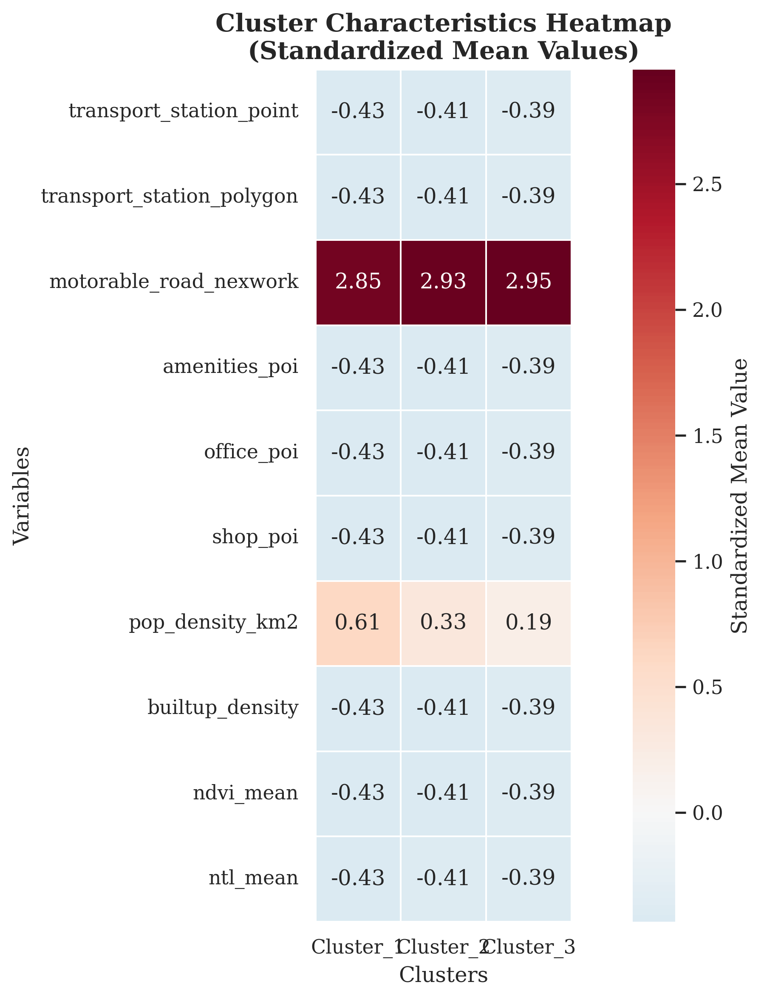

In [14]:
# 9. Create heatmap of cluster characteristics 
print("\n9. Creating cluster characteristics heatmap...")

# 标准化数据以便更好地可视化
from sklearn.preprocessing import StandardScaler
cluster_characteristics_scaled = pd.DataFrame(
    StandardScaler().fit_transform(cluster_characteristics.T),
    index=cluster_characteristics.T.index,
    columns=cluster_characteristics.T.columns
)

plt.figure(figsize=(10, 8))
sns.heatmap(cluster_characteristics_scaled, annot=True, cmap='RdBu_r',
            center=0, fmt='.2f', cbar_kws={'label': 'Standardized Mean Value'},
            linewidths=0.5, square=True)
plt.title('Cluster Characteristics Heatmap\n(Standardized Mean Values)',
          fontsize=14, fontweight='bold')
plt.xlabel('Clusters')
plt.ylabel('Variables')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('image/cluster_characteristics_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


10. Comparing clusters with existing EPI categories...
Cluster vs EPI Category Cross-tabulation (Row percentages):
EPI_Category   Above Average (0 to +1σ)  Below Average (-1σ to 0)  \
Cluster_Label                                                       
Cluster_1                          25.5                       0.7   
Cluster_2                          53.1                      43.1   
Cluster_3                           3.1                      21.3   
All                                41.0                      33.4   

EPI_Category   High (+1σ to +2σ)  Low (-2σ to -1σ)  Very High (>+2σ)  \
Cluster_Label                                                          
Cluster_1                   65.2               0.0               8.6   
Cluster_2                    2.5               1.3               0.0   
Cluster_3                    0.0              34.8               0.0   
All                         11.4               6.4               1.3   

EPI_Category   Very Low (<-2σ)  
Clu

<Figure size 3600x1800 with 0 Axes>

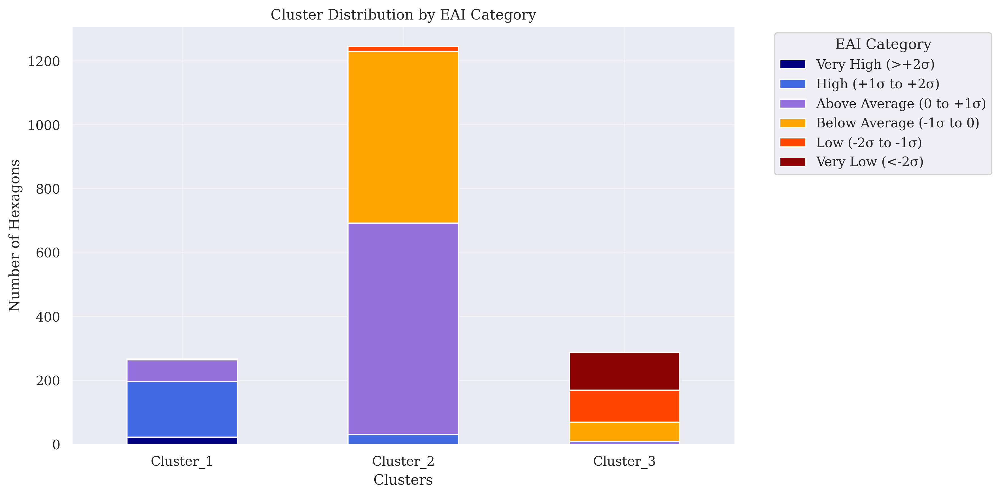

In [21]:
# 10. Compare clusters with EPI categories
print("\n10. Comparing clusters with existing EPI categories...")

# Cross-tabulation between clusters and EPI categories
cluster_epi_crosstab = pd.crosstab(gdf_clean['Cluster_Label'], gdf_clean['EPI_Category'],
                                  margins=True, normalize='index') * 100
print("Cluster vs EPI Category Cross-tabulation (Row percentages):")
print(cluster_epi_crosstab.round(1))

# Visualize the relationship (using default colors)
plt.figure(figsize=(12, 6))
cluster_epi_crosstab_counts = pd.crosstab(gdf_clean['Cluster_Label'], gdf_clean['EPI_Category'])

# Create stacked bar chart with colors matching EPI Z-score values
# Color mapping based on EPI categories (from low to high Z-scores):
epi_color_map = {
    'Very Low (<-2σ)': '#8B0000',      # Dark red (lowest)
    'Low (-2σ to -1σ)': '#FF4500',     # Orange red
    'Below Average (-1σ to 0)': '#FFA500',  # Orange
    'Above Average (0 to +1σ)': '#9370DB',  # Medium purple
    'High (+1σ to +2σ)': '#4169E1',    # Royal blue
    'Very High (>+2σ)': '#000080'      # Navy blue (highest)
}

# Reorder columns from highest to lowest EPI values for legend
epi_order = ['Very High (>+2σ)', 'High (+1σ to +2σ)', 'Above Average (0 to +1σ)',
             'Below Average (-1σ to 0)', 'Low (-2σ to -1σ)', 'Very Low (<-2σ)']

# Reorder the crosstab dataframe columns
existing_cols = [col for col in epi_order if col in cluster_epi_crosstab_counts.columns]
cluster_epi_crosstab_reordered = cluster_epi_crosstab_counts[existing_cols]

# Get colors in the reordered sequence
epi_colors = [epi_color_map.get(col, '#808080') for col in existing_cols]

ax = cluster_epi_crosstab_reordered.plot(kind='bar', stacked=True, figsize=(12, 6),
                                        color=epi_colors)
plt.title('Cluster Distribution by EAI Category')
plt.xlabel('Clusters')
plt.ylabel('Number of Hexagons')
plt.legend(title='EAI Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig('image/cluster_vs_epi_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

In [16]:
# 11. Save results
print("\n11. Saving clustering results...")

# Create output directory if it doesn't exist
os.makedirs('output/clustering', exist_ok=True)

# Save the GeoDataFrame with cluster information
output_shapefile = 'output/clustering/jaipur_pc_clusters.shp'
output_parquet = 'output/clustering/jaipur_pc_clusters.parquet'

gdf_clean.to_file(output_shapefile, driver='ESRI Shapefile')
gdf_clean.to_parquet(output_parquet, index=False)

print(f"✅ Shapefile saved: {output_shapefile}")
print(f"✅ Parquet saved: {output_parquet}")

# Save cluster analysis results
cluster_summary = {
    'optimal_k': optimal_k,
    'elbow_detection_method': 'Silhouette Score Maximum Distance from Line',
    'silhouette_score': final_silhouette,
    'calinski_harabasz_score': final_calinski,
    'davies_bouldin_score': final_davies,
    'cluster_sizes': cluster_counts.to_dict(),
    'cluster_centers_pc1_pc2': cluster_centers_original.tolist(),
    'all_k_silhouette_scores': dict(zip(k_range, silhouette_scores)),
    'elbow_analysis_distances': dict(zip(k_range, distances))
}

# Save cluster statistics
cluster_stats.to_csv('output/clustering/cluster_statistics.csv')
cluster_characteristics.to_csv('output/clustering/cluster_characteristics.csv')

print("✅ Cluster analysis files saved in output/clustering/")


11. Saving clustering results...
✅ Shapefile saved: output/clustering/jaipur_pc_clusters.shp
✅ Parquet saved: output/clustering/jaipur_pc_clusters.parquet
✅ Cluster analysis files saved in output/clustering/


In [17]:
# 12. Summary and interpretation
print("\n" + "="*60)
print("CLUSTERING ANALYSIS SUMMARY")
print("="*60)

print(f"Optimal number of clusters: {optimal_k}")
print(f"Total hexagons clustered: {len(gdf_clean)}")
print(f"Clustering quality metrics:")
print(f"  - Silhouette Score: {silhouette_score(X_scaled, cluster_labels):.3f} (range: -1 to 1, higher is better)")
print(f"  - Calinski-Harabasz Score: {calinski_harabasz_score(X_scaled, cluster_labels):.1f} (higher is better)")
print(f"  - Davies-Bouldin Score: {davies_bouldin_score(X_scaled, cluster_labels):.3f} (lower is better)")

print(f"\nCluster distribution:")
for cluster, count in cluster_counts.items():
    percentage = (count / len(gdf_clean)) * 100
    print(f"  {cluster}: {count} hexagons ({percentage:.1f}%)")

print(f"\nCluster centers (original PC scale):")
for i, center in enumerate(cluster_centers_original):
    print(f"  Cluster {i+1}: PC1={center[0]:.3f}, PC2={center[1]:.3f}")

print(f"\nNext steps:")
print(f"  1. Use the saved shapefile for spatial visualization in QGIS")
print(f"  2. Analyze cluster characteristics in detail")
print(f"  3. Validate clusters with domain knowledge")
print(f"  4. Consider the relationship between clusters and existing EPI categories")

print("\n" + "="*60)


CLUSTERING ANALYSIS SUMMARY
Optimal number of clusters: 3
Total hexagons clustered: 1799
Clustering quality metrics:
  - Silhouette Score: 0.554 (range: -1 to 1, higher is better)
  - Calinski-Harabasz Score: 1986.6 (higher is better)
  - Davies-Bouldin Score: 0.643 (lower is better)

Cluster distribution:
  Cluster_1: 267 hexagons (14.8%)
  Cluster_2: 1245 hexagons (69.2%)
  Cluster_3: 287 hexagons (16.0%)

Cluster centers (original PC scale):
  Cluster 1: PC1=2.343, PC2=2.113
  Cluster 2: PC1=0.326, PC2=-0.663
  Cluster 3: PC1=-3.593, PC2=0.911

Next steps:
  1. Use the saved shapefile for spatial visualization in QGIS
  2. Analyze cluster characteristics in detail
  3. Validate clusters with domain knowledge
  4. Consider the relationship between clusters and existing EPI categories




13. Creating spatial maps with consistent colors...


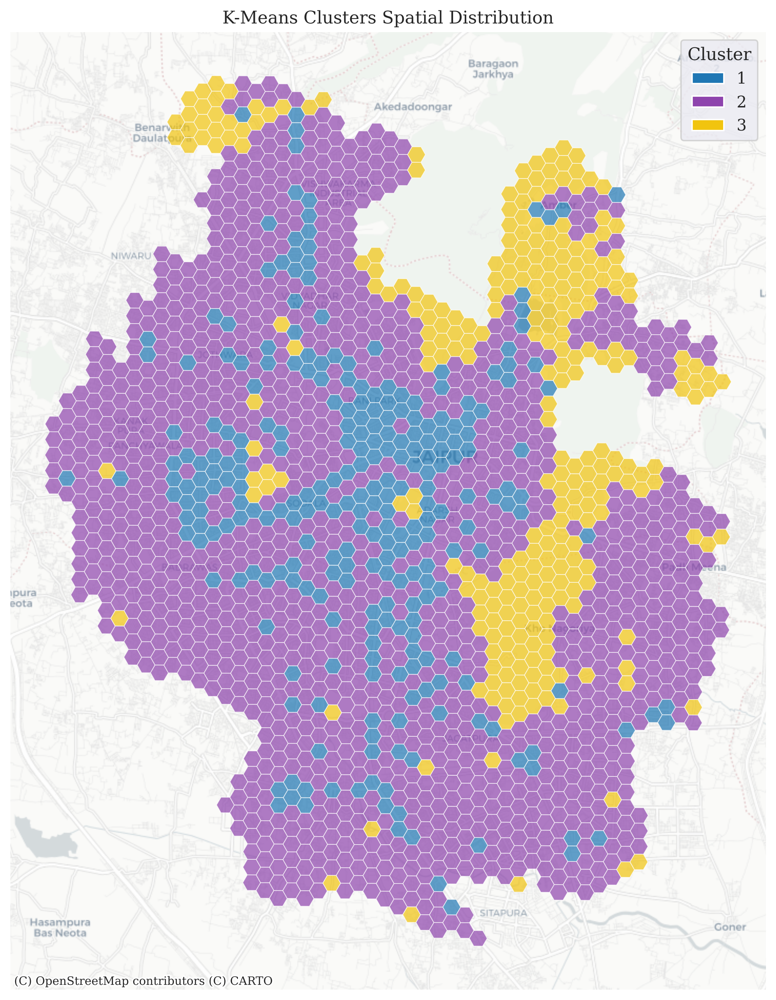

In [18]:
# Map visualization with consistent colors
print("\n13. Creating spatial maps with consistent colors...")



import matplotlib.colors as mcolors
cmap = mcolors.ListedColormap(cluster_colors[:optimal_k])

import contextily as ctx


gdf_web = gdf_clean.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(15, 12))


gdf_web['Cluster_Display'] = gdf_web['Cluster'] + 1

im = gdf_web.plot(column='Cluster_Display', categorical=True, legend=True,
                  cmap=cmap, ax=ax, alpha=0.7, edgecolor='white', linewidth=0.5)


ctx.add_basemap(ax, crs=gdf_web.crs, source=ctx.providers.CartoDB.Positron)
ax.set_title('K-Means Clusters Spatial Distribution')
ax.set_axis_off()


from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=cluster_colors[i], label=f'{i+1}')
                   for i in range(optimal_k)]
ax.legend(handles=legend_elements, title='Cluster', loc='upper right')

plt.savefig('image/kmeans_clusters_map.png', dpi=300, bbox_inches='tight')
plt.show()

In [19]:
gdf_clean.columns

Index(['hex_id', 'geometry', 'cover', 'transport_station_point',
       'transport_station_polygon', 'motorable_road_nexwork', 'amenities_poi',
       'office_poi', 'shop_poi', 'area_clip', 'pop_sum', 'builtup_sum',
       'ndvi_mean', 'ntl_mean', 'pop_density_km2', 'builtup_density',
       'PC1_Score_Original', 'PC1_Score_Corrected', 'PC2_Score', 'EPI_o',
       'EPI', 'EPI_o_Category', 'EPI_Category', 'Cluster', 'Cluster_Label',
       'Cluster_Color'],
      dtype='object')

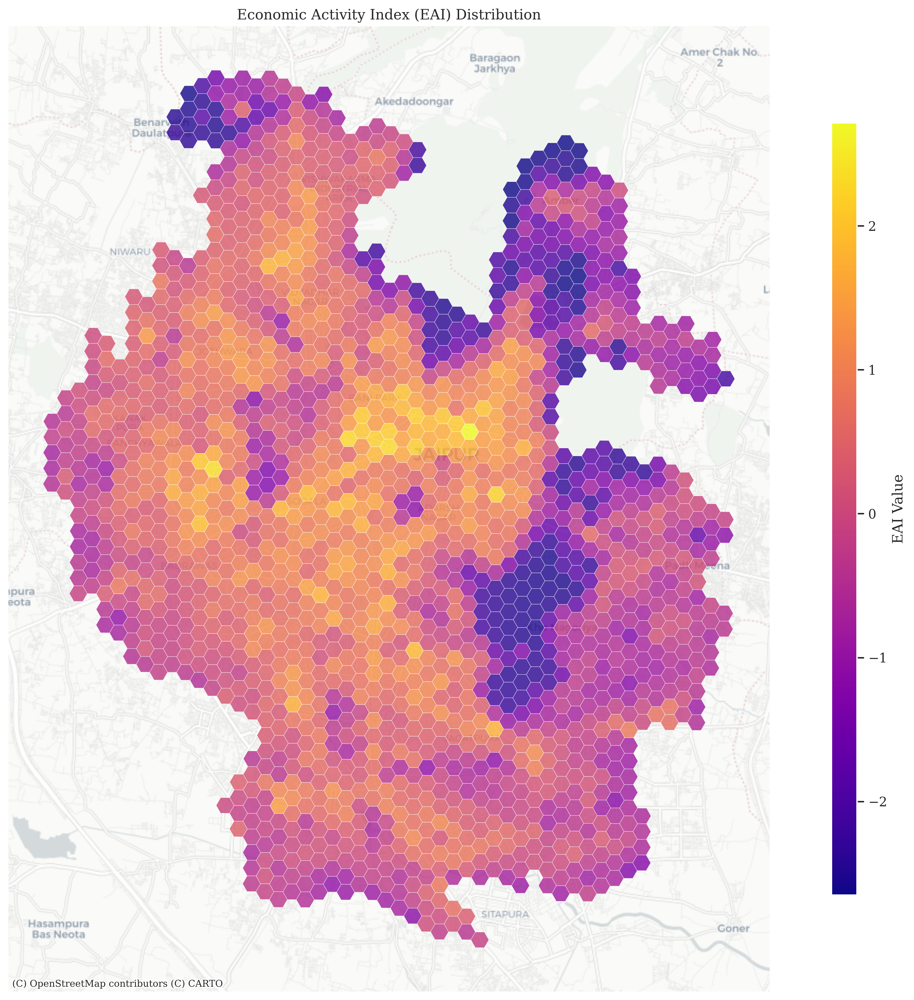

In [20]:
import matplotlib.pyplot as plt
import contextily as ctx
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

# Convert coordinate system to Web Mercator for basemap
gdf_web = gdf_clean.to_crs(epsg=3857)

# Create figure
fig, ax = plt.subplots(figsize=(15, 12))

# Plot EPI_o values
im = gdf_web.plot(column='EPI_o',
                  cmap='plasma',  # Purple (low) to yellow (high)
                  legend=True,
                  ax=ax,
                  alpha=0.8,
                  edgecolor='white',
                  linewidth=0.3,
                  legend_kwds={'shrink': 0.8, 'aspect': 30})

# Add CartoDB.Positron basemap
ctx.add_basemap(ax, crs=gdf_web.crs, source=ctx.providers.CartoDB.Positron)

# Set title and formatting
ax.set_title('Economic Activity Index (EAI) Distribution')
ax.set_axis_off()

# Get colorbar and set label with reversed orientation
cbar = ax.get_figure().get_axes()[-1]
cbar.set_ylabel('EAI Value', rotation=90)

# # Add statistics text box
# stats_text = f"""EPI_o Statistics:
# Min: {gdf_clean['EPI_o'].min():.3f}
# Max: {gdf_clean['EPI_o'].max():.3f}
# Mean: {gdf_clean['EPI_o'].mean():.3f}
# Std: {gdf_clean['EPI_o'].std():.3f}"""

# # Add text box to upper left corner of the map
# ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
#         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.savefig('image/epi_o_distribution_map.png', dpi=300, bbox_inches='tight')
plt.show()

